<h1><center>
    
<font size="6" color="black">
    Projet Python : modélisation de maladies infectieuses
</font>
<br><br>
<font size="4" color="black">
    Aeson Feehan — Romain Ilbert — Emmanuel Merone
</font>

</center></h1>

__Plan du notebook :__  
__I.__ Préliminaires : formats, constantes, packages  
__II.__ Tests unitaires  
__III.__ Propagation d'une maladie infectieuse  
__IV.__ Visualisation des données simulées  
__V.__ Analyse des méthodes de vaccination

__Avant-propos :__
1. Pour exécuter sans problème les algorithmes utilisés, il convient de
    - importer les packages en __I.__,
    - exécuter les fonctions de la partie __III. Propagation d'une maladie infectieuse__,
    - exécuter les fonctions de la partie __V. Analyse des méthodes de vaccination__,
    - exécuter les fonctions `test[i]` pour `i` variant de 2 à 4. `test1` crée un gif animé et recquiert la création et l'enregistrement dans un dossier du poste utilisé pour l'exécution.
    - exécuter les fonctions de la partie __II. Tests unitaires__.
    
Les fonctions des autres parties sont soit moins importantes, soit enregistrent des données sur le poste de l'utilisateur (c'est le cas notamment pour la génération de gifs animés).
2. Dans ce notebook, la population est de type matricielle. Ce format a pour principal avantage la __simplification des calculs__ car elle n'a que deux dimensions et permet de désigner les individus de manière intiuitive par leurs coordonnées dans la matrice.

# I. Préliminaires : formats, constantes, packages

In [158]:
import random as rand
import matplotlib.pyplot as plt
import numpy as np
from math import floor

import unittest

# pour bettererGraph
from matplotlib import colors
import glob

# pour faire un gif animé
import os,sys
import datetime
import imageio
from pprint import pprint
import time
import datetime

In [231]:
Crate = 0.8  # taux de transmission
Hrate = 0.1  # taux de guérison
Drate = 0.1   # taux de mortalité des infectés
Brate = 0  # taux de natalité t
NDrate = 0 # taux de mortalité de causes naturelles

Dans la suite du code, on désignera par _matrice population_ une matrice tel que chaque coefficient donne l'état de chaque individu, donné par
1. __non-contaminé__ (et vivant)
2. __malade__ (et vivant)
3. __guéri__ (et vivant)
4. __mort__
5. __quarantaine__ (malade et vivant, mais incapable de transmettre les maladies)

En général, on désignera les individus d'une population par leurs coordonnées. Dans le cas le plus sophistiqué qui est implémenté dans ce projet, le graphe des états d'un individu est le suivant :

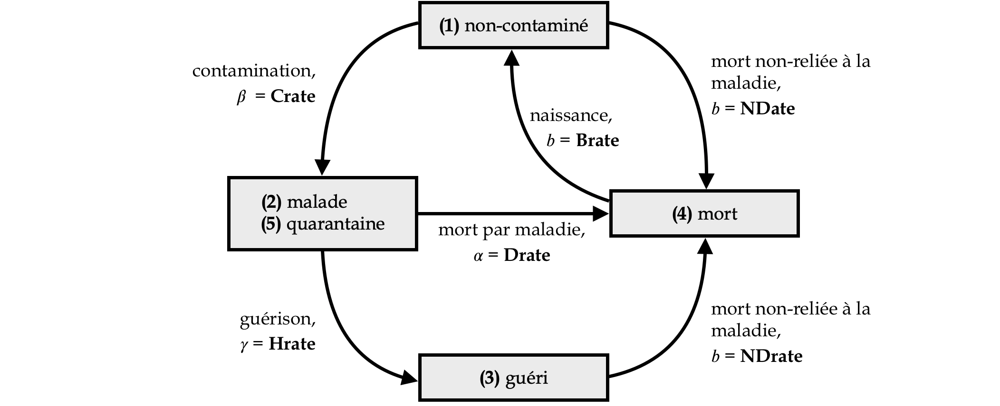

# II. Tests unitaires
On en définit cinq au total (toutes les fonctions ne sont pas testées) sur les fonctions les plus fondamentales. On aimerait encore établir d'autres tests ou des tests plus astucieux.

## II.A. Fonctions utilisées pour les tests

La fonction ``randTransMat`` génère une fonction de transmission non-normalisée aléatoire avec des coefficients compris dans l'ensemble $\{0,1,2,3\}$. Elle sert souvent pour les tests.

La fonction ``randNormTransMat`` génère une fonction de transmission normalisée aléatoire. Son utilisation est valable __dès lors que le premier test unitaire est vrai. Donc si le premier test est faux, les autres tests n'ont plus de sens__.

``randPop`` fait la même chose pour une population de taille ``n`` $\times$ ``m`` précisée en entrée et avec des coefficients dans l'ensemble $\{1,2,3,4,5\}$.

In [190]:
def randTransMat():
    T = np.zeros((7,7))
    for i in range(7):
        for j in range(7):
            if (i,j) != (3,3):
                T[i,j] = rand.randrange(0,3)
    return(T)

In [191]:
def randNormTransMat(): return(normalizeTransmission(randTransMat()))

In [192]:
def randPop(n,m):
    P = np.zeros((n,m))
    for i in range(n):
        for j in range(m):
            P[i,j] = rand.randrange(1,6)
    return(P)

## II.B. Reformattage et vérification de contraintes

In [193]:
class FormatTest(unittest.TestCase):
    
    def test_normalizeTransmission(self):
        T = randTransMat()
        S = normalizeTransmission(T)
        s = 0
        for i in range(7):
            for j in range(7):
                s += S[i,j]
        self.assertEqual(floor(1000*(s+0.0001)),1000)
    
    def test_candidates(self):
        T = randTransMat()
        for k in range(10):
            i = rand.randrange(1,7)
            j = rand.randrange(1,7)
            C = candidates(9,9,i,j,T)
            for a in range(7):
                for b in range(7):
                    if C[a,b] == 1:
                        self.assertIn(8-a,range(9))
                        self.assertIn(8-b,range(9))

#unittest.main(argv=['first-arg-is-ignored'], exit=False)

## II.C. Propagation et fonctions dépendantes

In [194]:
class PropagationTest(unittest.TestCase):
    
    def test_infect(self):
        i = rand.randrange(1,100)
        j = rand.randrange(1,100)
        a = rand.randrange(i-3,i+4,1)
        b = rand.randrange(j-3,j+4,1)
        T = randTransMat()
        T = normalizeTransmission(T)
        self.assertIn(infect(i,j,a,b,T),[True,False])
    
    def test_transmitHeal(self):
        n = rand.randrange(1,100)
        m = rand.randrange(1,100)
        T = randNormTransMat()
        P1 = randPop(n,m)
        P2 = transmitHeal(T,P1)
        for i in range(n):
            for j in range(m):
                p = P2[i,j]
                if p == 1:
                    self.assertIn(p,[1,2,4])
                if p == 2:
                    self.assertIn(p,[2,4,5])
                if p == 3:
                    self.assertIn(p,[3,5])
                if p == 4:
                    self.assertIn(p,[4,1])
                if p == 5:
                    self.assertIn(p,[3,4,5])

    def test_quarantine(self):
        n = rand.randrange(1,100)
        m = rand.randrange(1,100)
        maxQuar = rand.randrange(1,10) #maximum de mises-en-quarantaine
        
        T = randNormTransMat()
        P1 = randPop(n,m)
        P2 = quarantine(P1,maxQuar)
        
        q = 0
        for i in range(n):
            for j in range(m):
                p1 = P1[i,j]
                p2 = P2[i,j]
                if p1 == 2:
                    self.assertIn(p2,[2,5])
                if p2 == 5 and p1 != 5: #new inmate detected
                    q += 1
        self.assertIn(q,range(maxQuar+1))
    
unittest.main(argv=['first-arg-is-ignored'], exit=False)

.....
----------------------------------------------------------------------
Ran 5 tests in 0.097s

OK


# III. Propagation d'une maladie infectieuse

## II.A. Matrice de transmission (contribution originale)

Afin de modéliser différents types de transmission de la même maladie, on utilise une matrice ``T`` dîte _de transmission_. Celle-ci donnera la probabilité de transmission de la maladie aux 48 individus les plus proches (en norme infinie) de l'individu transmetteur.

On donne ci-dessous trois cas :
1. celui d'une maladie qui se transmet de proche en proche, tel que le VIH,
2. permettant une transmission à plus grande distance, comme c'est le cas pour la grippe,
3. permettant une transmission très probable à très grande distance, comme c'est le cas pour la rougeole.

Afin de faciliter l'entrée de telles matrices, elles sont automatiquement normalisées pour que la somme des ses coefficients vaille 1. Par exemple, dans le cas 1 ci-dessous, les 1 seront remplacés par des $\frac{1}{8}$ au début de l'algorithme de propagation. Les trois cas ci-dessous représentent une maladie de __même coefficient de transmission__, mais pouvant atteindre des individus de plus en plus loin de l'individu transmetteur.

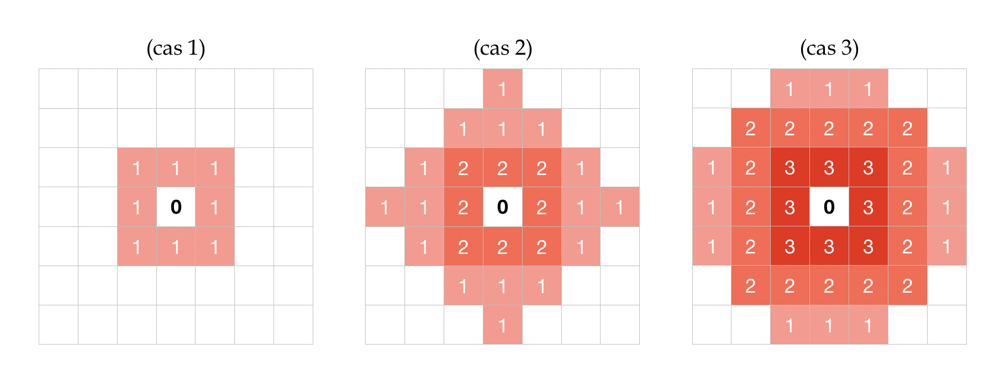

La fonction ``normalizeTransmission`` normalise une matrice de transmission ``T`` pour que la somme de ses coefficients vaille 1. La matrice ``T`` en entrée a des coefficients entiers (de type int), tandis que la matrice T en sortie a des coefficients décimaux (de type float).

In [195]:
def normalizeTransmission(T):
    (n,m) = T.shape
    S = 0
    for i in range(n):
        for j in range(m):
            if T[i,j] != 0:
                S += T[i,j]
    for i in range(n):
        for j in range(m):
            T[i,j] = T[i,j]/float(S)
    return(T)

Les fonctions ``case[n]`` permettent de sélectionner des cas de matrice transmission prédéfinis, notamment les cas 1,2,3 représentés ci-dessus. Cela évite d'avoir à les entrer à la main lors de tests. Les implémentations ci-dessous ne sont pas astucieuses.

In [196]:
def case0T(): #cas très restrictif non-représenté, sans propagation aux diagonales adjacentes
    T = np.zeros((7,7))
    T[3,2],T[3,4],T[2,3],T[4,3] = 1,1,1,1 #lateral neighbors
    return(T)

def case1T():
    T = np.zeros((7,7))
    T[3,2],T[3,4],T[2,3],T[4,3] = 1,1,1,1 #lateral neighbors
    T[2,2],T[4,4],T[2,4],T[4,2] = 1,1,1,1 #diagonal neighbors
    return(T)

def case2T():
    T = np.zeros((7,7))
    T[3,2],T[3,4],T[2,3],T[4,3] = 2,2,2,2 #lateral neighbors
    T[2,2],T[4,4],T[2,4],T[4,2] = 2,2,2,2 #diagonal neighbors
    T[0,3],T[1,2],T[1,3],T[1,4] = 1,1,1,1 #upper triangle
    T[3,0],T[2,1],T[3,1],T[4,1] = 1,1,1,1 #left triangle
    T[6,3],T[5,2],T[5,3],T[5,4] = 1,1,1,1 #lower triangle
    T[3,6],T[2,5],T[3,5],T[4,5] = 1,1,1,1 #right triangle
    return(T)

def case3T():
    T = np.zeros((7,7))
    for i in range(7):
        for j in range(7):
            t = 1
            if i>0 and i<6 and j>0 and j<6:
                t += 1
            if i>1 and i<5 and j>1 and j<5:
                t += 1
            T[i,j] = t
    Zeros = [[3,3],[0,0],[0,1],[1,0],[6,0],[5,0],[6,1]]
    Zeros += [[6,6],[6,5],[5,6],[6,0],[6,1],[5,0]]
    for i in range(7):
        for j in range(7):
            if [i,j] in Zeros:
                T[i,j] = 0
    
    return(T)

In [197]:
case3T()

array([[0., 0., 1., 1., 1., 1., 1.],
       [0., 2., 2., 2., 2., 2., 1.],
       [1., 2., 3., 3., 3., 2., 1.],
       [1., 2., 3., 0., 3., 2., 1.],
       [1., 2., 3., 3., 3., 2., 1.],
       [0., 2., 2., 2., 2., 2., 0.],
       [0., 0., 1., 1., 1., 0., 0.]])

## II.B. Propagation et fonctions associées

### II.B.1. Fonctions préliminaires

Pour éviter les erreurs d'indexation aux bords de la matrice de population, la fonction ``candidates`` désigne tous les voisins d'un individu malade qu'il est susceptible d'infecter s'ils étaient non-contaminés et vivants (état 1). Les variables d'entrée sont :
- ``(n,m)`` les dimensions de la matrice de population,
- ``(i,j)`` les coordonnées de l'individu transmetteur,
- ``T`` la matrice de transmission propre à la maladie transmise.

On aurait pu se passer de cet algorithme en créant un mur de caractères non-utilisés (de 6 par exemple) autour des matrices de population.

In [198]:
def candidates(n,m,i,j,T):
    Cands = np.zeros((7,7))
    for k in range(7):
        for r in range(7):
            cand = True            #(i+k,j+r) est candidat
            if (k,r) == (3,3):     #(i,j) ne transmet pas à lui-meme
                cand = False
            elif i+k-3 > n-1 or i+k-3<0: #l'indice depasse de P verticalement
                cand = False
            elif j+r-3 > m-1 or j+r-3<0: #l'indice depasse de P horizontalement
                cand = False
            elif T[k,r] == 0:        #l'individu est trop loin pour cette maladie
                cand = False
            elif cand :
                Cands[k,r] = 1
    return(Cands)

La fonction ``infect`` décide de l'infection d'un individu ``(i+a,j+b)`` par un individu malade ``(i,j)``, à l'aide de la matrice de transmission normalisée ``T``, où ``(n,m)`` est la taille de la population.

In [199]:
def infect(i,j,a,b,T):
    p = rand.random()
    t = T[a-i+3,b-j+3]
    if p <= Crate*t:
        return True
    else :
        return False

À chaque instant du processus de propagation, ``transmitHealSIS`` détermine quels individus de la population ``P`` seront contaminés et lesquels seront guéris, à l'aide de la matrice de transmission ``T``, dans le modèle SIS. `transmitHeal` concerne le modèle SIR.

In [200]:
def transmitHealSIS(T,P):
    # T est une matrice de transmission normalisée
# P est la matrice de population
    (n,m) = P.shape
    for i in range(n):
        for j in range(m):
            if P[i,j] == 2 :
                Cands = candidates (n,m,i,j,T)
                for k in range(7):
                    for r in range(7):
                        if Cands[k,r] == 1 and P[i+k-3,j+r-3] == 1 :
                        #/!\ ordre des conditions
                            if infect(i,j,i+k-3,j+r-3,T):
                                P[i+k-3,j+r-3] = 2
            if P[i,j] == 2 :
                a = rand.random()
                if a <= Hrate:
                    P[i,j] = 1
    return(P)

__Une difficulté rencontrée :__
L'ordre des conditions aux lignes 10 et 11 de la fonction ci-dessous a été la cause de la perte de deux bonnes heures de temps de développement. En effet, l'indexation est assez complexe du fait du changement de perspective : on doit numéroter tantôt avec les coordonnées de la matrice de population, tantôt avec les coordonnées du carré $7\times 7$ autour de l'individu transmetteur. D'autre part, les erreurs d'indexation liées aux dépassements du cadre de la population générée ont donné lieu à la fonction `candidates` donnée précédemment.

In [201]:
def transmitHeal(T,P):
# T est une matrice de transmission normalisée
# P est la matrice de population
    (n,m) = P.shape
    for i in range(n):
        for j in range(m):
            if P[i,j] == 2 :
                Cands = candidates (n,m,i,j,T)
                for k in range(7):
                    for r in range(7):
                        if Cands[k,r] == 1 and P[i+k-3,j+r-3] == 1 :
                        #/!\ ordre des conditions
                            if infect(i,j,i+k-3,j+r-3,T):
                                P[i+k-3,j+r-3] = 2
            if P[i,j] in [2,5] :
                a = rand.random()
                if a <= Hrate:
                    P[i,j] = 3
    return(P)

__Un calcul de complexité détaillé :__  
Déterminons la complexité de l'algorithme `transmitHeal` :
1. Il parcourt la matrice `P`, ce qui a pour coût $n\times m$(dimensions de la matrice).
2. Pour chaque individu/coefficient de la matrice, il exécute `candidates`, qui réalise toujours 49 opérations.
3. Pour les 48 cases autour de l'individu sélectionné, dans le pire des cas, l'algorithme appelle `infect`, qui réalise 3 opérations (dont un appel à `random.random`)
4. Dans le pire des cas, l'individu est malade et l'algorithme réalise deux opérations (dont un appel à `random.random`).

Finalement, le coût est en $O(nm)$.

Indépendemment de la maladie, ``recyclePop`` fait naître en mourir des individus au sein de la population.

In [202]:
def recyclePop(P):
    (n,m) = P.shape
    for i in range(n):
        for j in range(m):
            if P[i,j] == 2:
                death = rand.random()
                if death <= Drate:
                    P[i,j] = 4
            if P[i,j] in [1,3]:
                death = rand.random()
                if death <= NDrate:
                    P[i,j] = 4
            if P[i,j] == 4:
                birth = rand.random()
                if birth <= Brate:
                    P[i,j] = 1
    return(P)

La fonction ``quarantaine`` met au maximum ``M`` individus en malade en quarantaine à une étape donnée dans une population de taille ``n``$\times$``m``.

In [203]:
def quarantine(P,M):
    (n,m) = P.shape
    P2 = np.copy(P)
    Cands = []
    for i in range(n):
        for j in range(m):
            if P2[i,j] == 2:
                Cands.append([i,j])
    if Cands != []:
        l = 1/float(len(Cands))
        k = 1
        while k <= M and Cands != [] :
            a = rand.random()
            newInmate = int(floor(a*(len(Cands))))
            C = Cands[newInmate]
            P2[C[0],C[1]] = 5
            Cands.pop(newInmate)
            k += 1
    return(P2)

La fonction ``stayinAlive`` retourne pour une population ``P`` de taille ``n``$\times$``m`` la valeur ``True`` si la maladie est vivante et ``False`` sinon.

In [204]:
def stayinAlive(n,m,P):
    for i in range(n):
        for j in range(m):
            if P[i,j] == 2 or P[i,j] == 5:
                return True
    return False

### III.B.2. Fonctions de propagation

La fonction de propagation la plus simple est `simpleSISpropagation`. Elle ne prend pas en compte la structure de la population : chaque individu malade infecte aléatoirement chaque individu sain. Comme elle est simple, elle ne mobilise aucune autre fonction.

Sa complexité est en $O(t_{\mathrm{max}}n^2m^2)$, ce qui est moins bon que celle des fonctions de propagation un peu plus sophistiquées qui suivent. On prendra donc soin dans les phases de test et de représentation de l'exécuter sur des petites populations ($10\times10$ au maximum).

In [205]:
def simpleSISpropagation(P,tmax):
    R = []
    (n,m) = P.shape
    t = 0          #indicateur du temps écoulé
    itLives = True #la maladie n'a pas encore été éradiquée
    while itLives and t <= tmax:
        for i in range(n):
            for j in range(m):
                if P[i,j] == 2:
                    for k in range(n):
                        for l in range(m):
                            a = rand.random()
                            if a <= Crate/float(n*m):
                                P[k,l] = 0
        for i in range(n):
            for j in range(m):
                if P[i,j] == 0:
                    P[i,j] = 2
                if P[i,j] == 2:
                    a = rand.random()
                    if a <= Hrate:
                        P[i,j] = 1
        t += 1
        R.append(np.copy(P))
    return(R,t)

`SISpropagation` correspond au deuxième algorithme élaboré, qui ne prend que 5 paramètres en entrée et ne fait pas appel à autant de fonctions, ce qui reflète la simplicité relative du modèle SIS, mais la population admet une certaine structure.

In [206]:
def SISpropagation(P0,T,tmax,vac,r):
    R = []
    (n,m) = P0.shape
    T = normalizeTransmission(T)
    t = 0          #indicateur du temps écoulé
    itLives = True #la maladie n'a pas encore été éradiquée
    P = vac(P0,r)
    while itLives and t <= tmax:
        P = transmitHealSIS(T,P)
        itLives = stayinAlive(n,m,P)
        t += 1
        R.append(np.copy(P))
    return(R,t)

La fonction ``propagation`` ci-dessous simule la propagation d'une maladie de matrice de transmission ``T``, dans une population ``P``, pour une durée ``tmax`` ou jusqu'à ce que la maladie soit éradiquée. ``maxQuar`` donne le nombre maximal de mises-en-quarantaine par tour. ``vac`` est le numéro de la fonction donnant la stratégie de vaccination (voir suite du document).

In [301]:
def propagation(P0,T,tmax,maxQuar,vac,r):
    R = []
    (n,m) = P0.shape
    T = normalizeTransmission(T)
    t = 0          #indicateur du temps écoulé
    itLives = True #la maladie n'a pas encore été éradiquée
    while itLives and t <= tmax:
        if vac == stratVac1 and t == 0:
            P = vac(P0,r)
        elif vac == stratVac2 and t%50 == 0:
            P = vac(P0,r)
        else :
            P = P0
        Pt = transmitHeal(T,P)
        Pr = recyclePop(Pt)
        if t > 100:
            P = quarantine(Pr,maxQuar)
        else :
            P = np.copy(Pr)
        itLives = stayinAlive(n,m,P)
        t += 1
        R.append(np.copy(P))
    return(R,t)

# IV. Visualisation des données simulées

<center>

    Légende : vert:sain, rouge:malade, noir:décédé, orange:guéri, bleu:quarantaine
    
    Paramètres : Crate = 0.6, Hrate = 0.2, Drate = 0.5, Brate = 0.1, NDrate = 0.001
</center>

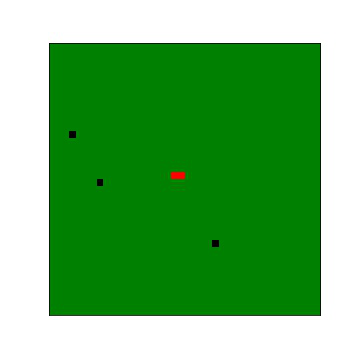

__Remarque :__ la fonction de mise-en-quarantaine a changé depuis la génération de ce gif, et se fait de manière aléatoire sur tous les malades, au lieu du cas ci-dessus, où la mise-en-quarantaine se fait par priorité lexicographique sur les coordonnées des individus. L'ancienne méthode, comme on peut le voir sur le graphique, a tendance à "pousser" la maladie dans une certaine direction.

Les variables globales ci-dessous servent pour enregistrer les résulatats des fonctions `bettererGraph`, `create_gif`, `suiviEtats`, `suiviAvgEtats`, `plotVacImpact` et `plotVacImpact2`. Par défaut, la sauvegarde ne se fait pas lorsqu'elle n'est pas vitale pour l'exécution, on peut la réactiver en enlevant les commentaires dans les fonctions en question.

Il faut spécifier les variables globales ci-dessous à la main et créer manuellement des dossiers avec le bon nom et addresse. On aimerait encore les mettre dans une classe pour pouvoir les modifier à chaque exécution et automatiser la création de nouveaux dossiers avec le module _os_.

In [297]:
adress = '/Users/aesonfeehan/Documents/SCHOOL/ENSAE1/PYTHON/projets/propagation/propagation_graphics/'
graphNumber = '_17'  #pour l'enregistrement des graphes
popGenNumber = '_12' #pour l'enregistrement des gif

On importe ici pas mal de modules. ``glob`` sert pour gérer les fichiers des images qui sont produites en sortie de ``bettererGraph``, permettant d'obtenir facilement la liste des tous les fichiers qui sont contenus dans un dossier spécifié.

La fonction ``bettererGraph`` s'appelle ainsi parce que l'ancienne fonction utilisait des _heatmaps_ du package seaborn, ce qui fonctionnait, mais on avait du mal à configurer les couleurs de la légende. On utilisera donc le package ``matplotlib``.

La fonction prend en entrée une liste des matrices de population au cours du temps d'une expérience.

In [215]:
def bettererGraph(Populations):
    # create discrete colormap
    cmap = colors.ListedColormap(['green','red','orange','black','blue'])
    bounds = [0.5,1.5,2.5,3.5,4.5,5.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)

    k = 0
    files = glob.glob(adress+'g'+popGenNumber+'/*')
    for f in files:
        os.remove(f)
    for P in Populations :
        fig, ax = plt.subplots(figsize=(7, 7))
        ax.imshow(P, cmap=cmap, norm=norm)
        ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=1)
        ax.set_xticks(np.arange(0));
        ax.set_yticks(np.arange(0));
        plt.savefig(adress+'g'+popGenNumber+'/state%d.jpg' %k)
        plt.close(fig)
        k += 1
        

La fonction ``simpleGraph`` sert pour faire des tests facilement, en affichant une matrice population.

In [216]:
def simpleGraph(P):
    cmap = colors.ListedColormap(['green','red','orange','black','blue'])
    bounds = [0.5,1.5,2.5,3.5,4.5,5.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(P, cmap=cmap, norm=norm)
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=1)
    ax.set_xticks(np.arange(0));
    ax.set_yticks(np.arange(0));

La fonction ``test1`` teste la création d'images avec ``bettererGraph``. Elle prend en entrée les dimensions de la population de la simulation.

In [220]:
def test1(n,m):
    T = case1T()
    P = np.zeros((n,m))
    for i in range(n):
        for j in range(m):
            P[i,j] = 1
    P[n//2-1,m//2-1] = 2
    
    (R,t) = propagation(P,T,500,0,stratVac2,0.2)
    bettererGraph(R)
    
    print(t)

test1(100,100)

298


La fonction ``make_video`` ci-dessous est empruntée à Xavier Dupré, et sert à transformer une série d'images (correspondant ici en général aux états successifs d'une population) en une vidéo. Elle ne fonctionne pas encore, mais c'est dû à une compréhension incomplète des fonctions utilisée.

In [27]:
def make_video(outvid = adress+'g9/g9video', fps=5, size=None,
               is_color=True, format="XVID"):
    """
    Create a video from a list of images.
 
    @param      outvid      output video
    @param      fps         frame per second
    @param      size        size of each frame
    @param      is_color    color
    @param      format      see http://www.fourcc.org/codecs.php
    @return                 see http://opencv-python-tutroals.readthedocs.org/en/latest/py_tutorials/py_gui/py_video_display/py_video_display.html
 
    The function relies on http://opencv-python-tutroals.readthedocs.org/en/latest/.
    By default, the video will have the size of the first image.
    It will resize every image to this size before adding them to the video.
    """
    files = glob.glob(adress+'g9/*')
    K = len(files)
    images = [adress+'g9/state%d.jpg' %k for k in range(K)]
    from cv2 import VideoWriter, VideoWriter_fourcc, imread, resize
    fourcc = VideoWriter_fourcc(*format)
    vid = None
    for image in images:
        if not os.path.exists(image):
            raise FileNotFoundError(image)
        img = imread(image)
        if vid is None:
            if size is None:
                size = img.shape[1], img.shape[0]
            vid = VideoWriter(outvid, fourcc, float(fps), size, is_color)
        if size[0] != img.shape[1] and size[1] != img.shape[0]:
            img = resize(img, size)
        vid.write(img)
    vid.release()
    return vid

``create_gif`` transforme les images générées par ``bettererGraph`` en un gif animé, ce qui permet de vérifier facilement le bon fonctionnement de l'algorithme de propagation.

In [221]:
e = sys.exit

files = glob.glob(adress+'g'+popGenNumber+'/*')
K = len(files)
filenames = [adress+'g'+popGenNumber+'/state%d.jpg' %k for k in range(K)]
    
def create_gif(filenames, duration):
    images = []
    for filename in filenames:
        images.append(imageio.imread(filename))
    output_file = adress+'g'+popGenNumber+'/Gif-%s.gif' % datetime.datetime.now().strftime('%Y-%M-%d-%H-%M-%S')
    imageio.mimsave(output_file, images, duration=duration)

create_gif(filenames, 0.07)

# V. Analyse des méthodes de vaccination

À ce stade de l'analyse, on sait que les simulations fonctionnent correctement (cela se vérifie par exemple à l'aide des .gif animés, qui sont également divertissants). On se propose maintenant de faire des expériences théoriques avec ces modèles et d'en tirer des conclusions sur les méthodes de vaccination notamment. On s'intéressera pour cela
1. au nombre d'individus dans chaque état au cours du temps d'une simulation,
2. du nombre médian de décès liés à la maladie selon la méthode de vaccination,
3. du nombre de décès liés à la maladie pour un échantillon de simulations.

## V.A. Suivi des états au cours d'une simulation
Ici, on fait une seule simulation et on trace les graphes du nombre d'individus dans chaque état au cours du temps, pour vérifier que l'on obtient bien — comme en théorie — un état stationnaire du nombre d'infectés.

La fonction ``suiviEtats`` ci-dessous prend en entrée une liste de populations au cours d'une expérience de propagation, la matrice de transmission et le temps maximal de l'expérience (pour éviter les exécutions infinies lorsqu'il y a un état stationnaire), simule une expérience et renvoie le graphe voulu.

La fonction `suiviAvgEtats` en est une amélioration : elle permet de réaliser un grand nombre d'expériences et de tracer le graphe du nombre d'individus moyen dans chaque état pour chaque instant. __Cet algorithme peut être très lent tout comme il peut être très rapide__ (de quelques secondes à plusieurs heures si `tmax` est trop généreux), selon la valeur de $R_0$ : si la maladie survit, toutes les expériences sont longues. À l'inverse, on peut réaliser 300 expériences en quelques secondes lorsque $R_0<1$.

In [29]:
def suiviEtats(R,T):
    tmax = len(R)
    AllStates = np.zeros((5,tmax)) #nombre d'individus dans chaque etat pour toute l'experience
    States = np.zeros((1,5)) #nombre d'individus dans chaque etat à un instant t
    t = 0
    for P in R:
        (i0,j0) = P.shape
        for i in range(i0):
            for j in range(j0):
                for k in range(5):
                    if P[i,j] == k+1:
                        States[0,k] += 1
        for k in range(5):
            AllStates[k,t] = float(States[0,k])/float(i0*j0)
        States = np.zeros((1,5))
        t += 1
    
    fig, ax = plt.subplots(figsize=(10, 8))
    fig.suptitle('Etats en fonction du temps',fontsize=14)
    ax.set_title('n=m=%d, Crate = %f, Hrate = %f, Drate = %f, Brate = %f, NDrate = %f'%(i0,Crate,Hrate,Drate,Brate,NDrate))

    T = [k for k in range(tmax)]
    
    Gmorts = plt.plot(T,AllStates[3,:],label = 'morts')
    Gmalades = plt.plot(T,AllStates[1,:],label = 'malades')
    Ggueris = plt.plot(T,AllStates[2,:],label = 'gueris')
    #Gquarantaine = plt.plot(T,AllStates[4,:],label = 'quarantaine')
    #GmortNat = plt.plot(T,[i0*j0*NDrate for k in range(tmax)], label = 'mortalite moyenne naturelle')
    
    plt.xlabel('temps')
    plt.legend()
    #plt.savefig(adress+'graphs/graph'+graphNumber)
    plt.show()

In [302]:
def suiviAvgEtats(Rss,T):
    All3states = []
    for Rs in Rss:
        tmax = 0
        for R in Rs:
            l = len(R)
            if l>tmax:
                tmax = l

        (i0,j0) = Rs[0][0].shape
        l = len(Rs)
        AllStates = np.zeros((5,tmax)) #nombre d'individus dans chaque etat pour toute l'experience
        for R in Rs:
            States = np.zeros((1,5)) #nombre d'individus dans chaque etat à un instant t
            t = 0
            for P in R:
                for i in range(i0):
                    for j in range(j0):
                        for k in range(5):
                            if P[i,j] == k+1:
                                States[0,k] += 1
                for k in range(5):
                    AllStates[k,t] += States[0,k]
                States = np.zeros((1,5))
                t += 1

        #on divise par l'effectif d'expériences pour obtenir une moyenne
        #on le fait ici pour préserver plus de précision sur les valeurs
        (a,b) = AllStates.shape
        for i in range(a):
            for j in range(b):
                AllStates[i,j] = float(AllStates[i,j])/float(l)
        All3states.append(AllStates)
    
    fig, ax = plt.subplots(figsize=(10, 8))
    fig.suptitle('Etats en fonction du temps, sans structure',fontsize=14)
    ax.set_title('n=m=%d, Crate = %f, Hrate = %f, Drate = %f, Brate = %f, NDrate = %f'%(i0,Crate,Hrate,Drate,Brate,NDrate))

    for j in range(len(All3states)):
        tmax = len(All3states[j][1,:])
        T = [k for k in range(tmax)]
        #Gmorts = plt.plot(T,All3states[j][3,:],label = 'morts')
        Gmalades = plt.plot(T,All3states[j][1,:],label = 'malades')
        #Ggueris = plt.plot(T,All3states[j][2,:],label = 'gueris')
        #Gquarantaine = plt.plot(T,All3states[j][4,:],label = 'quarantaine')
        #GmortNat = plt.plot(T,[i0*j0*NDrate for k in range(tmax)], label = 'mortalite moyenne naturelle')
    
    plt.xlabel('temps')
    plt.ylabel('nombre moyen d\'individus infectes')
    plt.legend()
    #plt.savefig(adress+'graphs/graph'+graphNumber)
    plt.show()

La fonction `test2` exécute la fonction ci-dessus sur une population avec un individu infecté au centre à l'initialisation.

Elle prend en entrée les dimensions `n` et `m` de la population à générer, `tmax` la durée limite d'une expérience, `niter` le nombre d'expériences. La complexité de l'algorithme est linéaire en ce quatrième paramètre, qui accroît la précision sur les valeurs moyennes calculées.

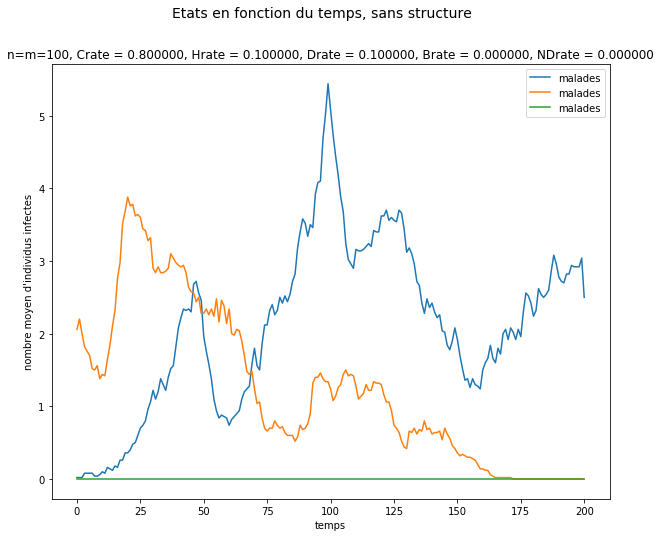

In [303]:
def test2(n,m,tmax,niter):
    T = case1T()
    P = np.zeros((n,m))
    for i in range(n):
        for j in range(m):
            P[i,j] = 1
    P[n//2-1,m//2-1] = 2
    
    Rs1,Rs2,Rs3 = [],[],[]
    for n in range(niter):
        (R,t) = propagation(P,T,tmax,0,stratVac2,0.2)
        Rs1.append(R)
        (R,t) = propagation(P,T,tmax,0,stratVac1,0.2)
        Rs2.append(R)
        (R,t) = propagation(P,T,tmax,1,stratVac1,0)
        Rs3.append(R)
    
    suiviAvgEtats([Rs1,Rs2,Rs3],T)

test2(100,100,200,50)

## V.B. Nombre médian de morts pour un échantillon d'expériences
Afin d'examiner l'impact de différentes politiques de contenance de la maladie, on définit une fonction `medianDeaths` qui réalise un nombre `iterMax` d'expériences sur une population de taille `n`$\times$`m` et qui renvoie flottant correspondant au nombre médian de décès. `tmax`,`maxQuar`,`vac`,`r` sont les mêmes variables que celles en entrée de la fonction `propagation`.

In [32]:
def medianDeaths(T,n,m,iterMax,tmax,maxQuar,vac,r):
    D = [] #décès pour chaque expérience
    for k in range(iterMax):
        P = np.zeros((n,m))
        for i in range(n):
            for j in range(m):
                P[i,j] = 1
        P[n//2-1,m//2-1] = 2
        (R,t) = propagation(P,T,tmax,maxQuar,vac,r)
        Pf = R[len(R)-1]
        d = 0 #nombre de morts au cours de l'expérience
        for i in range(n):
            for j in range(m):
                if Pf[i,j] == 4:
                    d += 1
        D.append(d)
    D.sort()
    return(D[iterMax//2])

#Ttest0 = case1T()
#medianDeaths(Ttest0,50,50,100,500,0,stratVac1,0.1)

## V.C. Stratégies de vaccination
Jusqu'ici, on n'a simulé que de la propagation sans vaccination. On définit dans cette partie différentes fonctions, appelées _stratégies de vaccination_, qui s'implémenteront dans la fonction de propagation directement.

### V.C.1. Définition des stratégies
La première fonction est très proche de ``quarantine`` et sélectionne parmi les individus sains une proportion ``r`` à vacciner en début d'expérience. On n'en a en fait implémenté qu'une, mais on peut imaginer des stratégies plus sophistiqués, par exemple qui ciblent en priorité un secteur de la population.

In [33]:
def stratVac1(P,r):
    (n,m) = P.shape
    P2 = np.copy(P)
    for i in range(n):
        for j in range(m):
            if P2[i,j] == 1:
                a = rand.random()
                if a < r:
                    P2[i,j] = 3
    return(P2)

Cette deuxième stratégie privilégie l'entourage du malade.

In [34]:
def caseVac2():
    T = np.zeros((7,7))
    for i in range(7):
        for j in range(7):
            if i<6 and i>0 and j<6 and j>0:
                T[i,j] = 1
    return T

In [166]:
def stratVac2(P,r):
    (n,m) = P.shape
    T = caseVac2()
    for i in range(n):
        for j in range(m):
            if P[i,j] == 2:
                Cands = candidates(n,m,i,j,T)
                for a in range(7):
                    for b in range(7):
                        if Cands[a,b] == 1.0  and P[i+a-3,j+b-3] == 1:
                            c = rand.random()
                            if c <= r:
                                P[i+a-3,j+b-3] = 3
    return P

[[0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 1. 1. 1. 1. 0.]
 [0. 1. 1. 1. 1. 1. 0.]
 [0. 1. 1. 0. 1. 1. 0.]
 [0. 1. 1. 1. 1. 1. 0.]
 [0. 1. 1. 1. 1. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0.]]


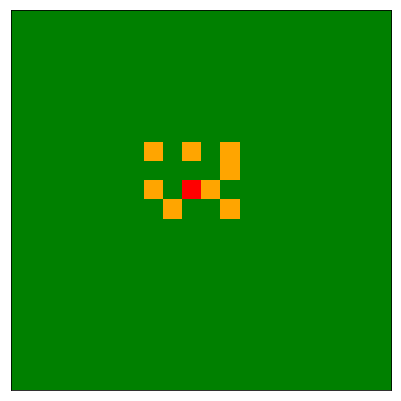

In [164]:
def test3(n,m):
    T = case1T()
    P = np.zeros((n,m))
    for i in range(n):
        for j in range(m):
            P[i,j] = 1
    P[n//2-1,m//2-1] = 2
    (Pfs,t) = propagation(P,T,500,0,stratVac2,0.5)
    Pf = Pfs[1]
    simpleGraph(Pf)
test3(20,20)

### V.B.1. Évaluation des stratégies
`plotVacImpact` prend en entrée les mêmes arguments de `medianDeaths`, sauf la liste `L` des valeurs du taux de vaccination à tester, qui substitue le taux auparavant unique `r`. On obtient des graphes de ce type (avec un dimensionnement plus adapté), qui donnent le taux de mortalité de la maladie en fonction du taux de vaccination.

L'algorithme est très lent lorsqu'on recherche des résultats précis. En effet, il exécute `len(L)` fois la fonction `medianDeaths`, qui est d'autant plus lent que les expériences durent longtemps.

In [37]:
def plotVacImpact(T,n,m,iterMax,tmax,maxQuar,vac,L):
    D = []
    C = [Crate for k in range(len(L))]
    fig, ax = plt.subplots(figsize = (12,7))
    plt.xlim(0,1.0)
    plt.ylim(0,0.4)
    plt.ylabel('taux de deces final')
    plt.xlabel('taux de vaccination')
    fig.suptitle('Mortalite et vaccination',fontsize=14)
    ax.set_title('n=m=%d, Crate = %f, Hrate = %f, Drate = %f, Brate = %f, NDrate = %f'%(n,Crate,Hrate,Drate,Brate,NDrate))
    plt.plot(L,C)
    for l in L:
        d = medianDeaths(T,n,m,iterMax,tmax,maxQuar,vac,l)
        D.append(float(d)/float(n*m))
        print(l)
    plt.plot(L,D)
    #plt.savefig(adress+'graphs/graph8')
    plt.show()

La fonction ci-dessous est obsolète et était censée afficher une barre de chargement pour le calcul du nombre médian de morts pour la liste `L` des taux de vaccinations donnée en entrée. Elle ne fonctionne pas comme on le souhaiterait, affichant `len(L)` barres de chargement distincts à la suite au lieu d'effacer à chaque fois l'ancienne et d'afficher la nouvelle. On donne la fonction pour information et éventuellement pour l'améliorer.

In [38]:
def plotVacImpact2(T,n,m,iterMax,tmax,maxQuar,vac,L):
    D = []
    bar = np.zeros((1,21))
    bar[0,0] = 1
    cmap = colors.ListedColormap(['white','blue'])
    bounds = [-0.5,0.5,1.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    k = 1
    for l in L:
        plt.clf()
        fig, ax = plt.subplots(figsize=(7,1))
        ax.imshow(bar, cmap=cmap, norm=norm)
        ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=1)
        ax.set_xticks(np.arange(0))
        ax.set_yticks(np.arange(0))
        plt.show()
        d = medianDeaths(T,n,m,iterMax,tmax,maxQuar,vac,l)
        D.append(d)
        bar[0,k] = 1
        k += 1
    plt.clf()
    plt.plot(L,D)

La fonction `test4` exécute `plotVacImpact` avec des paramètres adaptés dans la plupart des cas de propagation sophistiqués.

In [39]:
def test4():
    L = [float(k)/80 for k in range(20)]+[float(k)/20 for k in range(5,21)]
    T = case1T()
    n,m = 50,50
    iterMax = 100
    tmax = 1000
    maxQuar = 0
    vac = stratVac1
    plotVacImpact(T,n,m,iterMax,tmax,maxQuar,vac,L)
#test4()

# Conclusion et ouverture

Tout d'abord, on a réussi à développer trois algorithmes modélisant la propagation d'une maladie infectieuse, de __réalisme croissant__. Assez rapidement, la théorie mathématique a été laissée de côté car elle s'est avérée __trop compliquée à expliciter__. On aimerait encore implémenter un algorithme correspondant à la structure sociale discutée en partie III. qui tient compte du comportement — plus ou moins risqué — des individus. Concernant également cette partie du rapport, il reste à implémenter la méthode d'Euler généralisée pour résoudre le système d'équations différentielles. Ensuite, la visualisation des résultats a fonctionné, mais parfois avec un __coût en mémoire significatif__, qu'il convient de réduire. Enfin, les variables globales utilisées peuvent être remplacées par les attributs d'une classe et peuvent alors être modifiées par des fonctions. Cela permet d'__évaluer l'impact d'une même politique__ sur des maladies plus ou moins transmissibles, plus ou moins mortelles, ou qui se transmettent de différentes manières. C'est cette évaluation qui a un intérêt en termes de politique de santé lors d'une pandémie.